<center><h1 style = "color: skyblue">Facial detection in animated "Dexter's laboratory"</h1></center>

<h2 style = "color: green">1. Description</h2>

<h3 style = "color: orange">Developed by Genndy Tartakovsky and produced by Cartoon Network, "Dexter's Laboratory" is an animated series that had its premiere in 1996.  The show centers on the exploits of a young genius named Dexter, who has a top-secret, state-of-the-art laboratory in his room concealed beneath the bookshelves.</h3>

<h2 style = "color: green">2. Goal</h2>

<h3 style = "color: orange">The deployment of an automated facial recognition and detection system is the aim of this topic.
sound effects from the animated series Dexter's Laboratory, which were created in part in the lab and discussed in the course using Artificial Vision algorithms.</h3>

<h2 style = "color: green">3. Imports</h2>

In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit
from imblearn.under_sampling import RandomUnderSampler
import pandas as pd

import glob 
import timeit
import time
from sklearn.cluster import KMeans
from keras.models import Sequential
from keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.model_selection import train_test_split

2025-02-26 21:08:11.743181: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-02-26 21:08:12.640864: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


<h2 style = "color: green">4. Plot examples</h2>

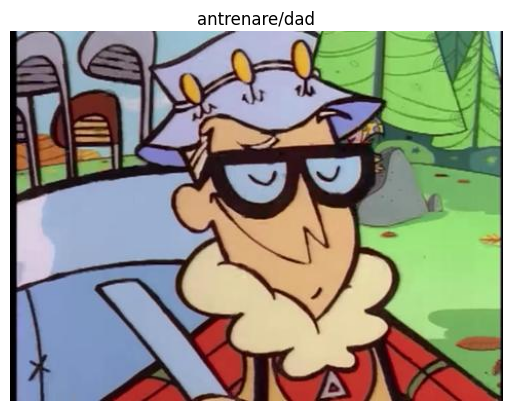

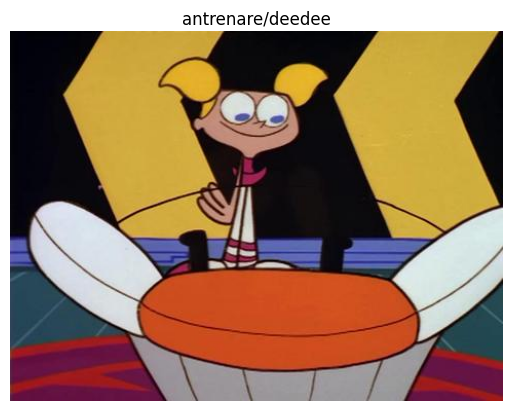

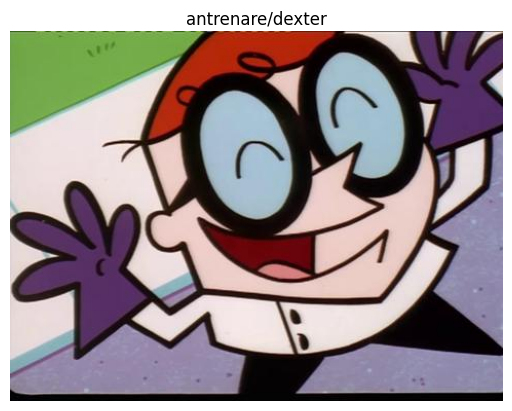

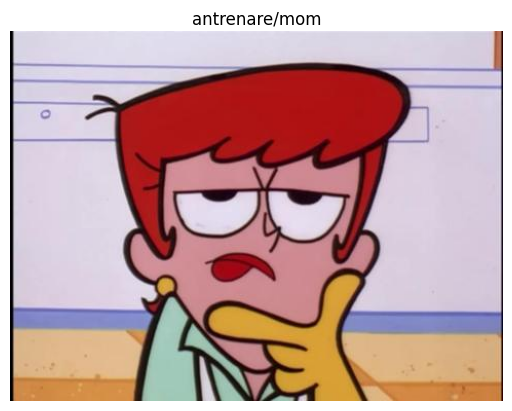

In [2]:
# plot each character
folders = ["antrenare/dad", "antrenare/deedee", "antrenare/dexter", "antrenare/mom"]

filename = "0025.jpg"

for folder in folders:
    image_path = os.path.join(folder, filename)

    img = cv2.imread(image_path)    

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # display
    plt.imshow(img_rgb)
    plt.title(folder)
    plt.axis('off')
    plt.show()

<h2 style = "color: green">5. Task 2: Facial detection of characters: Dexter, Dad, Mom, Deedee</h2>

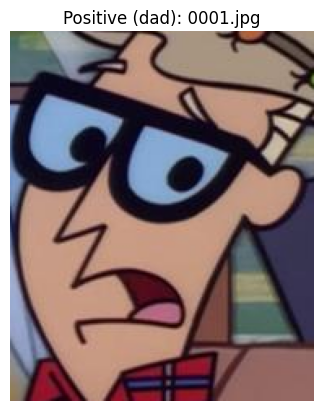

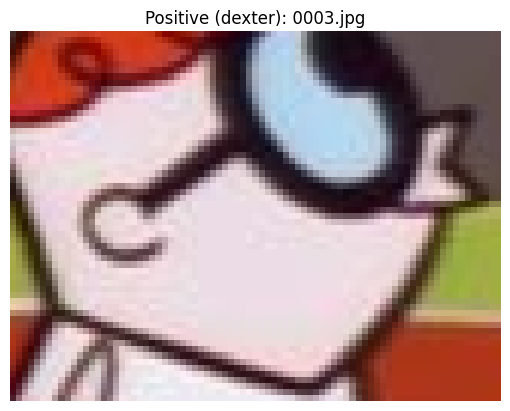

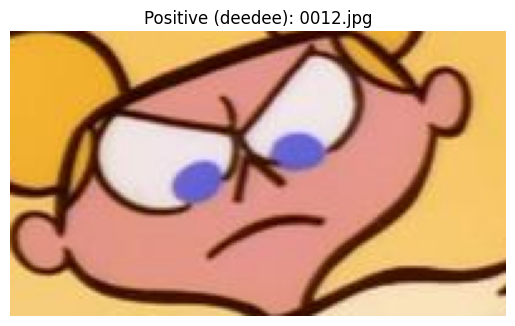

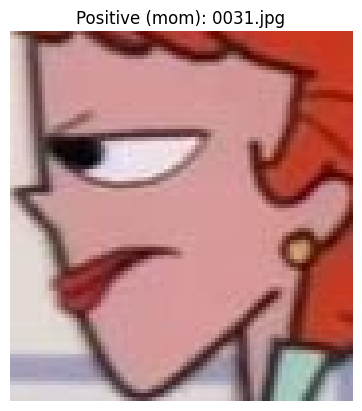

Dad dimensions (first 5): [[187, 228], [114, 146], [54, 87], [183, 273], [102, 120]]
Deedee dimensions (first 5): [[197, 113], [65, 59], [112, 126], [99, 92], [78, 62]]
Dexter dimensions (first 5): [[81, 61], [116, 76], [138, 84], [133, 74], [117, 71]]
Mom dimensions (first 5): [[87, 94], [35, 35], [35, 33], [54, 143], [102, 128]]


In [3]:
# Generating positive examples for each character (4 positive descriptors)


def process_annotations(file_path):
    with open(file_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if len(parts) < 6:
                continue
            img_name, x1, y1, x2, y2, label = parts
            x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
            yield img_name, (x1, y1, x2, y2), label

def compute_descriptor(img):
    resized = cv2.resize(img, (64, 64), interpolation=cv2.INTER_LANCZOS4)
    return resized.flatten()

# Separate variables for each character
dad_positive_descriptors = []
dad_image_dimensions = []
dad_plotted = False

deedee_positive_descriptors = []
deedee_image_dimensions = []
deedee_plotted = False

dexter_positive_descriptors = []
dexter_image_dimensions = []
dexter_plotted = False

mom_positive_descriptors = []
mom_image_dimensions = []
mom_plotted = False

annotation_files = [
    "./antrenare/dad_annotations.txt",
    "./antrenare/deedee_annotations.txt",
    "./antrenare/dexter_annotations.txt",
    "./antrenare/mom_annotations.txt"
]

for ann_file in annotation_files:
    base_name = os.path.basename(ann_file)
    folder_name = base_name.split('_')[0]
    folder_path = os.path.join("antrenare", folder_name)
    for img_name, bbox, label in process_annotations(ann_file):
        x1, y1, x2, y2 = bbox
        w = x2 - x1
        h = y2 - y1
        if label == "dad":
            dad_image_dimensions.append([w, h])
            img_path = os.path.join(folder_path, img_name)
            if not os.path.exists(img_path):
                continue
            img = cv2.imread(img_path)
            if img is None:
                continue
            cropped = img[y1:y2, x1:x2]
            if not dad_plotted:
                plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
                plt.title(f"Positive (dad): {img_name}")
                plt.axis('off')
                plt.show()
                dad_plotted = True
            descriptor = compute_descriptor(cropped)
            dad_positive_descriptors.append(descriptor)
        elif label == "deedee":
            deedee_image_dimensions.append([w, h])
            img_path = os.path.join(folder_path, img_name)
            if not os.path.exists(img_path):
                continue
            img = cv2.imread(img_path)
            if img is None:
                continue
            cropped = img[y1:y2, x1:x2]
            if not deedee_plotted:
                plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
                plt.title(f"Positive (deedee): {img_name}")
                plt.axis('off')
                plt.show()
                deedee_plotted = True
            descriptor = compute_descriptor(cropped)
            deedee_positive_descriptors.append(descriptor)
        elif label == "dexter":
            dexter_image_dimensions.append([w, h])
            img_path = os.path.join(folder_path, img_name)
            if not os.path.exists(img_path):
                continue
            img = cv2.imread(img_path)
            if img is None:
                continue
            cropped = img[y1:y2, x1:x2]
            if not dexter_plotted:
                plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
                plt.title(f"Positive (dexter): {img_name}")
                plt.axis('off')
                plt.show()
                dexter_plotted = True
            descriptor = compute_descriptor(cropped)
            dexter_positive_descriptors.append(descriptor)
        elif label == "mom":
            mom_image_dimensions.append([w, h])
            img_path = os.path.join(folder_path, img_name)
            if not os.path.exists(img_path):
                continue
            img = cv2.imread(img_path)
            if img is None:
                continue
            cropped = img[y1:y2, x1:x2]
            if not mom_plotted:
                plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
                plt.title(f"Positive (mom): {img_name}")
                plt.axis('off')
                plt.show()
                mom_plotted = True
            descriptor = compute_descriptor(cropped)
            mom_positive_descriptors.append(descriptor)

print("Dad dimensions (first 5):", dad_image_dimensions[:5])
print("Deedee dimensions (first 5):", deedee_image_dimensions[:5])
print("Dexter dimensions (first 5):", dexter_image_dimensions[:5])
print("Mom dimensions (first 5):", mom_image_dimensions[:5])

In [4]:
# kmeans for sliding window
dad_dimensions = np.array(dad_image_dimensions)
kmeans_dad = KMeans(n_clusters=10, random_state=0)
kmeans_dad.fit(dad_dimensions)
dad_kmeans_centers = kmeans_dad.cluster_centers_

deedee_dimensions = np.array(deedee_image_dimensions)
kmeans_deedee = KMeans(n_clusters=10, random_state=0)
kmeans_deedee.fit(deedee_dimensions)
deedee_kmeans_centers = kmeans_deedee.cluster_centers_

dexter_dimensions = np.array(dexter_image_dimensions)
kmeans_dexter = KMeans(n_clusters=10, random_state=0)
kmeans_dexter.fit(dexter_dimensions)
dexter_kmeans_centers = kmeans_dexter.cluster_centers_

mom_dimensions = np.array(mom_image_dimensions)
kmeans_mom = KMeans(n_clusters=10, random_state=0)
kmeans_mom.fit(mom_dimensions)
mom_kmeans_centers = kmeans_mom.cluster_centers_

/home/marius/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/marius/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/marius/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/marius/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1

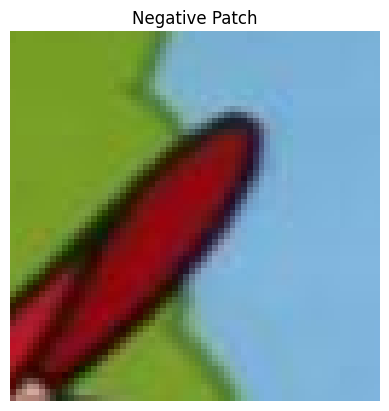

Number  of examples negative: 20000


In [5]:
# Generating negative examples


patch_sizes = [64, 80, 100, 120, 140]

def intersection_over_patch_area(patch_bbox, pos_bbox):
    x1 = max(patch_bbox[0], pos_bbox[0])
    y1 = max(patch_bbox[1], pos_bbox[1])
    x2 = min(patch_bbox[2], pos_bbox[2])
    y2 = min(patch_bbox[3], pos_bbox[3])
    inter_width = max(0, x2 - x1)
    inter_height = max(0, y2 - y1)
    inter_area = inter_width * inter_height
    patch_area = (patch_bbox[2] - patch_bbox[0]) * (patch_bbox[3] - patch_bbox[1])
    return inter_area / patch_area if patch_area > 0 else 0

def is_intersection_good(patch_bbox, pos_bbox, threshold=0.1):
    iopa = intersection_over_patch_area(patch_bbox, pos_bbox)
    pos_area = (pos_bbox[2] - pos_bbox[0]) * (pos_bbox[3] - pos_bbox[1])
    patch_area = (patch_bbox[2] - patch_bbox[0]) * (patch_bbox[3] - patch_bbox[1])
    if iopa > threshold * (pos_area / patch_area):
        return False
    return True

def compute_descriptor(img):
    resized = cv2.resize(img, (64, 64), interpolation=cv2.INTER_LANCZOS4)
    return resized.flatten()

folders = ["antrenare/dad", "antrenare/deedee", "antrenare/dexter", "antrenare/mom"]

negative_descriptors = []
negative_plotted = False
num_negative_per_image = 5
bboxes = []

for folder in folders:
    for filename in os.listdir(folder):
        if not filename.lower().endswith('.jpg'):
            continue
        image_path = os.path.join(folder, filename)
        img = cv2.imread(image_path)
        if img is None:
            continue
        num_rows, num_cols = img.shape[:2]
        for rep in range(num_negative_per_image):
            attempts = 0
            patch_found = False
            while attempts < 100:
                patch_size = patch_sizes[rep % len(patch_sizes)]
                if num_cols - patch_size <= 0 or num_rows - patch_size <= 0:
                    break
                x = np.random.randint(0, num_cols - patch_size)
                y = np.random.randint(0, num_rows - patch_size)
                x1, y1 = x, y
                x2, y2 = x1 + patch_size, y1 + patch_size
                negative_bbox = (x1, y1, x2, y2)
                if all(is_intersection_good(negative_bbox, pos_bbox) for pos_bbox in bboxes):
                    patch = img[y1:y2, x1:x2]
                    patch_found = True
                    break
                attempts += 1
            if patch_found:
                if not negative_plotted:
                    plt.imshow(cv2.cvtColor(patch, cv2.COLOR_BGR2RGB))
                    plt.title("Negative Patch")
                    plt.axis('off')
                    plt.show()
                    negative_plotted = True
                descriptor = compute_descriptor(patch)
                negative_descriptors.append(descriptor)
            else:
                print(f"No patch generated for rep = {rep} in {filename}")

negative_descriptors = np.array(negative_descriptors)
print("Number  of examples negative:", len(negative_descriptors))


In [6]:
# convert to descriptors

dad_positive_descriptors = np.array(dad_positive_descriptors)
deedee_positive_descriptors = np.array(deedee_positive_descriptors)
dexter_positive_descriptors = np.array(dexter_positive_descriptors)
mom_positive_descriptors = np.array(mom_positive_descriptors)
negative_descriptors = np.array(negative_descriptors)

print("Number of positive examples for dad:", len(dad_positive_descriptors))
print("Number of positive examples for deedee:", len(deedee_positive_descriptors))
print("Number of positive examples for dexter:", len(dexter_positive_descriptors))
print("Number of positive examples for mom:", len(mom_positive_descriptors))
print("Number of examples negative:", len(negative_descriptors))

Number of positive examples for dad: 1286
Number of positive examples for deedee: 1244
Number of positive examples for dexter: 1856
Number of positive examples for mom: 1033
Number of examples negative: 20000


In [7]:
# training and labels examples
def process_dataset(training_examples, train_labels, dataset_name):
    print(f"\nProcessing dataset: {dataset_name}")
    X_train, X_val, y_train, y_val = train_test_split(
        training_examples,
        train_labels,
        test_size=0.2,
        random_state=42
    )
    print(f"Total samples: {len(training_examples)}")
    print(f"Train size: {len(X_train)} | Validation size: {len(X_val)}")
    return X_train, X_val, y_train, y_val

In [8]:
# normalize the descriptors

# For Dad
dad_positive = np.array(dad_positive_descriptors)
dad_negative = np.array(negative_descriptors)
dad_training_examples = np.concatenate((dad_positive, dad_negative), axis=0)
dad_training_examples = dad_training_examples.astype('float32') / 255.0
dad_training_examples = dad_training_examples.reshape(-1, 64, 64, 3)
dad_labels = np.concatenate((np.ones(len(dad_positive)), np.zeros(len(dad_negative))), axis=0)
X_train_dad, X_val_dad, y_train_dad, y_val_dad = process_dataset(dad_training_examples, dad_labels, "dad")


Processing dataset: dad
Total samples: 21286
Train size: 17028 | Validation size: 4258


In [10]:
# Training with CNN Arhitecture - DAD

model = Sequential()

# Block 1
model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(64, 64, 3)))
model.add(BatchNormalization())
model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Block 2
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Block 3
model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Flatten and Dense layers
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))


# compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


history = model.fit(
    X_train_dad, y_train_dad,
    validation_data=(X_val_dad, y_val_dad),
    epochs=10,
    verbose=1
)

# save the model
save_dir = 'data/models'
os.makedirs(save_dir, exist_ok=True)
timestamp = int(time.time() * 1000)
file_name = f"model_dad_{timestamp}.h5"
model_save_path = os.path.join(save_dir, file_name)
model.save(model_save_path)

print(f"The model was saved at: {model_save_path}")

2025-02-26 21:08:49.406031: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-02-26 21:08:49.492178: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-02-26 21:08:49.492425: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Epoch 1/10


2025-02-26 21:08:52.147446: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2025-02-26 21:08:52.366406: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600
2025-02-26 21:08:52.787018: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2025-02-26 21:08:52.850573: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x7fc36234e600 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-02-26 21:08:52.850594: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2025-02-26 21:08:52.873663: I tensorflow/compiler/mlir/tensorflow/utils/du

533/533 [==============================] - 16s 20ms/step - loss: 0.1854 - accuracy: 0.9297 - val_loss: 0.0916 - val_accuracy: 0.9713
Epoch 2/10
533/533 [==============================] - 9s 18ms/step - loss: 0.0527 - accuracy: 0.9833 - val_loss: 0.0361 - val_accuracy: 0.9878
Epoch 3/10
533/533 [==============================] - 9s 18ms/step - loss: 0.0400 - accuracy: 0.9875 - val_loss: 0.0326 - val_accuracy: 0.9883
Epoch 4/10
533/533 [==============================] - 9s 18ms/step - loss: 0.0313 - accuracy: 0.9900 - val_loss: 0.0230 - val_accuracy: 0.9913
Epoch 5/10
533/533 [==============================] - 10s 18ms/step - loss: 0.0275 - accuracy: 0.9904 - val_loss: 0.0245 - val_accuracy: 0.9920
Epoch 6/10
533/533 [==============================] - 10s 18ms/step - loss: 0.0308 - accuracy: 0.9900 - val_loss: 0.0394 - val_accuracy: 0.9873
Epoch 7/10
533/533 [==============================] - 9s 17ms/step - loss: 0.0261 - accuracy: 0.9907 - val_loss: 0.3100 - val_accuracy: 0.8922
Epoch 8

/home/marius/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Sliding-window dimensions to test (kmeans.cluster_centers_):
[[ 94.1319797  109.01015228]
 [182.35051546 242.        ]
 [175.35344828 197.93103448]
 [263.61764706 334.79411765]
 [138.72327044 168.08805031]
 [218.57142857 272.75324675]
 [ 42.13235294  46.39705882]
 [ 67.43657817  75.27433628]
 [376.77777778 300.33333333]
 [118.03684211 137.01052632]]
200 test images found.

Processing test image 1/200: 001.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
4 patches with score > 0.95 identified.
Applying Non-Maximal Suppression (NMS) ...
1 final detections kept after NMS.


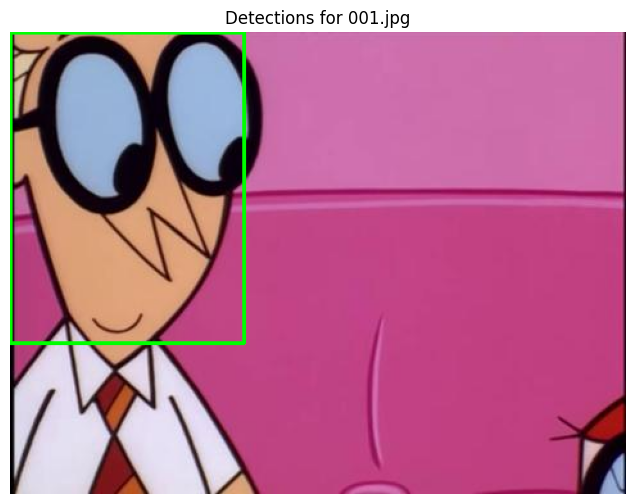

Processing time for image 1/200: 1.42 sec.

Processing test image 2/200: 002.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
1 patches with score > 0.95 identified.
Applying Non-Maximal Suppression (NMS) ...
1 final detections kept after NMS.


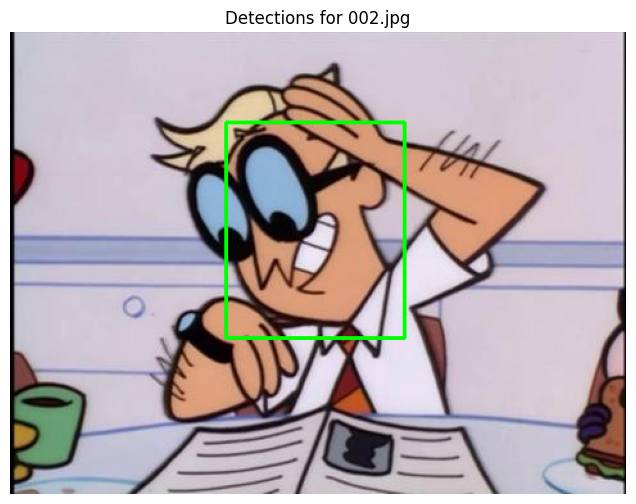

Processing time for image 2/200: 1.18 sec.

Processing test image 3/200: 003.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 3/200: 1.03 sec.

Processing test image 4/200: 004.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 4/200: 1.02 sec.

Processing test image 5/200: 005.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for

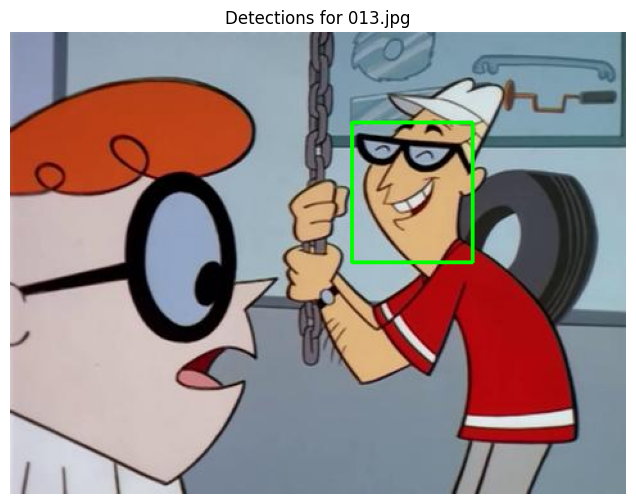

Processing time for image 13/200: 1.14 sec.

Processing test image 14/200: 014.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 14/200: 1.03 sec.

Processing test image 15/200: 015.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 15/200: 1.02 sec.

Processing test image 16/200: 016.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing ti

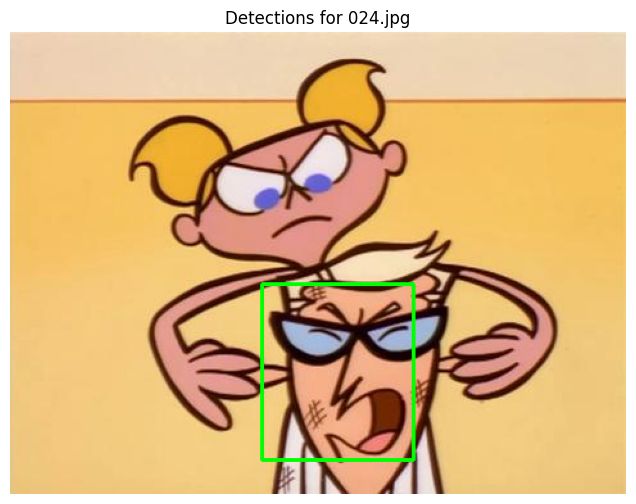

Processing time for image 24/200: 1.16 sec.

Processing test image 25/200: 025.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 25/200: 1.04 sec.

Processing test image 26/200: 026.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 26/200: 1.08 sec.

Processing test image 27/200: 027.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing ti

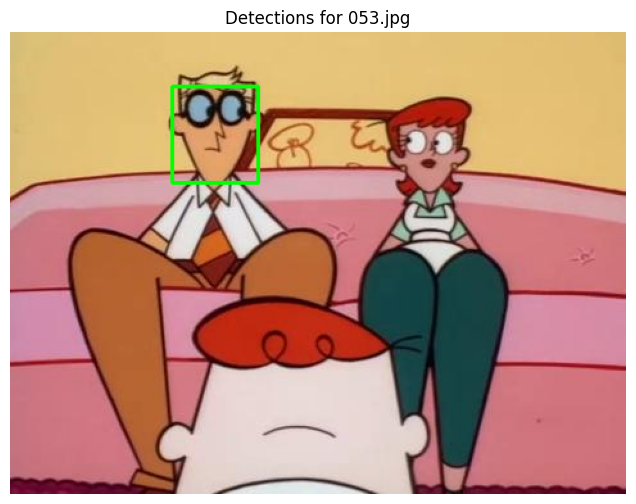

Processing time for image 53/200: 1.16 sec.

Processing test image 54/200: 054.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
5 patches with score > 0.95 identified.
Applying Non-Maximal Suppression (NMS) ...
1 final detections kept after NMS.


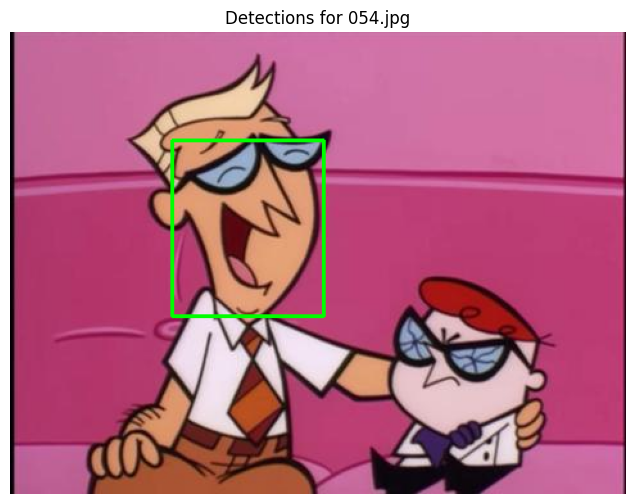

Processing time for image 54/200: 1.16 sec.

Processing test image 55/200: 055.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 55/200: 1.03 sec.

Processing test image 56/200: 056.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 56/200: 1.02 sec.

Processing test image 57/200: 057.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing ti

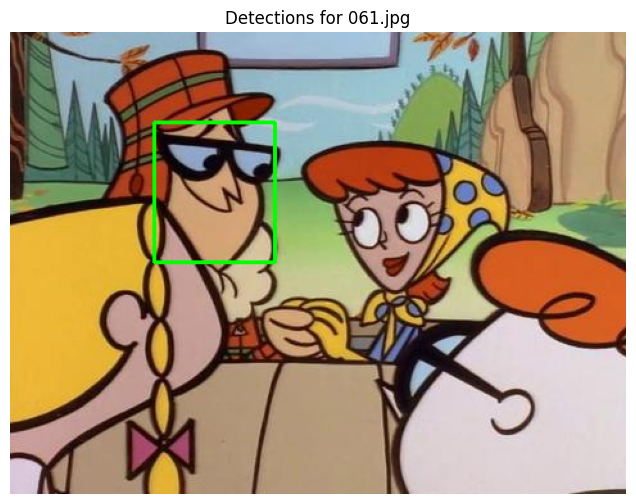

Processing time for image 61/200: 1.21 sec.

Processing test image 62/200: 062.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 62/200: 1.09 sec.

Processing test image 63/200: 063.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 63/200: 1.03 sec.

Processing test image 64/200: 064.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing ti

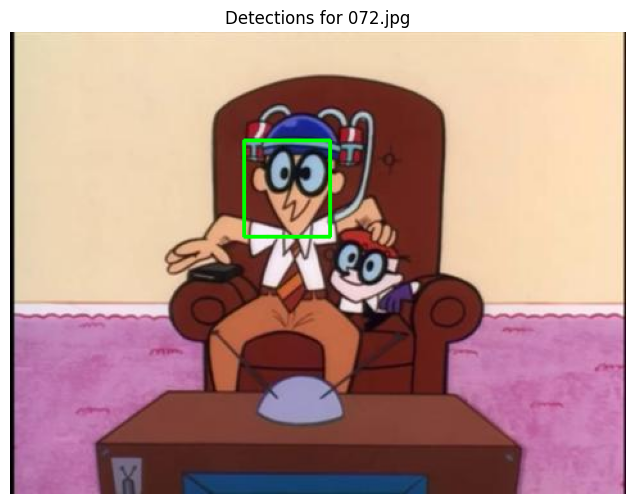

Processing time for image 72/200: 1.17 sec.

Processing test image 73/200: 073.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 73/200: 1.02 sec.

Processing test image 74/200: 074.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 74/200: 1.01 sec.

Processing test image 75/200: 075.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing ti

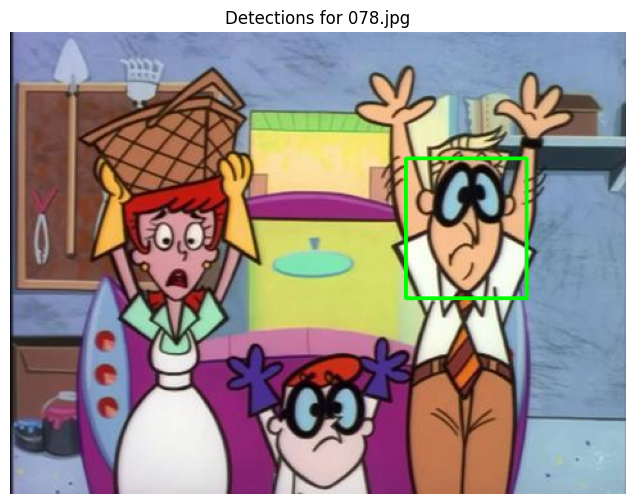

Processing time for image 78/200: 1.20 sec.

Processing test image 79/200: 079.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 79/200: 1.02 sec.

Processing test image 80/200: 080.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 80/200: 1.03 sec.

Processing test image 81/200: 081.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing ti

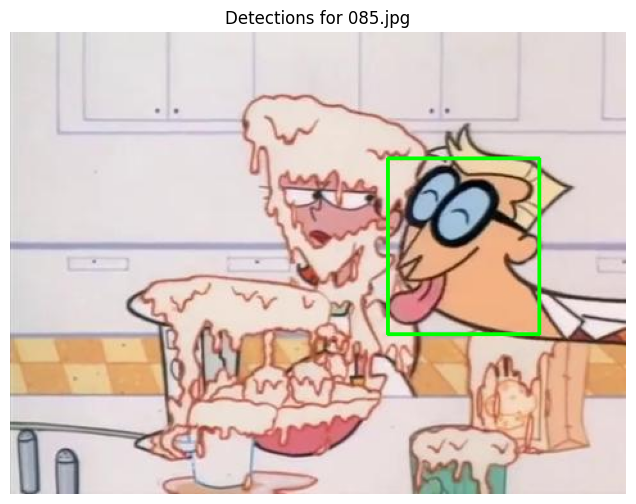

Processing time for image 85/200: 1.19 sec.

Processing test image 86/200: 086.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 86/200: 1.08 sec.

Processing test image 87/200: 087.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 87/200: 1.02 sec.

Processing test image 88/200: 088.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing ti

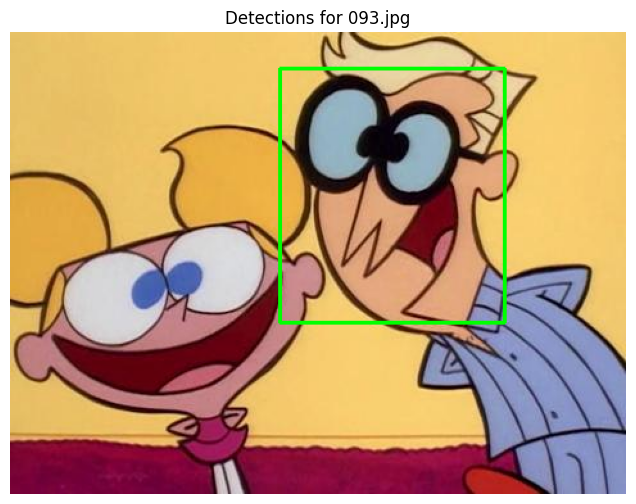

Processing time for image 93/200: 1.18 sec.

Processing test image 94/200: 094.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 94/200: 1.05 sec.

Processing test image 95/200: 095.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 95/200: 0.99 sec.

Processing test image 96/200: 096.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing ti

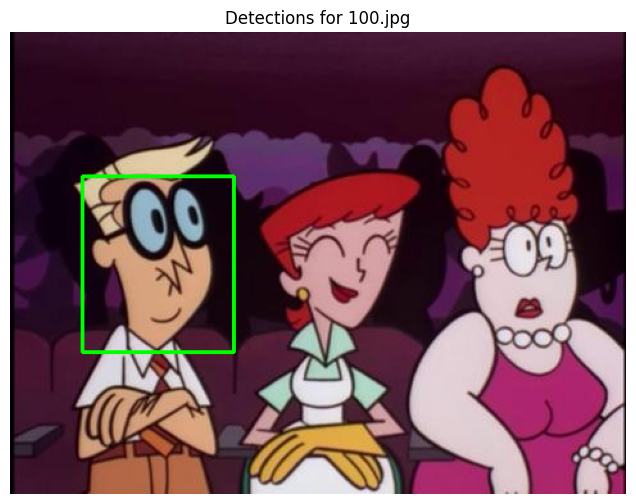

Processing time for image 100/200: 1.14 sec.

Processing test image 101/200: 101.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 101/200: 1.02 sec.

Processing test image 102/200: 102.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 102/200: 1.02 sec.

Processing test image 103/200: 103.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

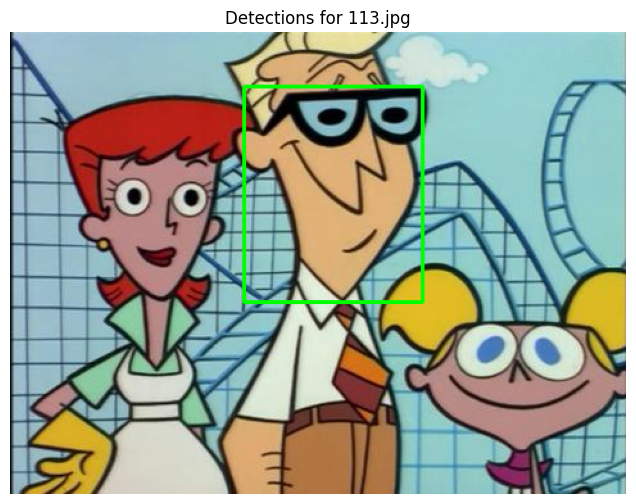

Processing time for image 113/200: 1.17 sec.

Processing test image 114/200: 114.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 114/200: 1.03 sec.

Processing test image 115/200: 115.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 115/200: 1.16 sec.

Processing test image 116/200: 116.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
3 patches with score > 0.95 identified.
Applying Non-Maximal Suppression (NMS) ...
1 f

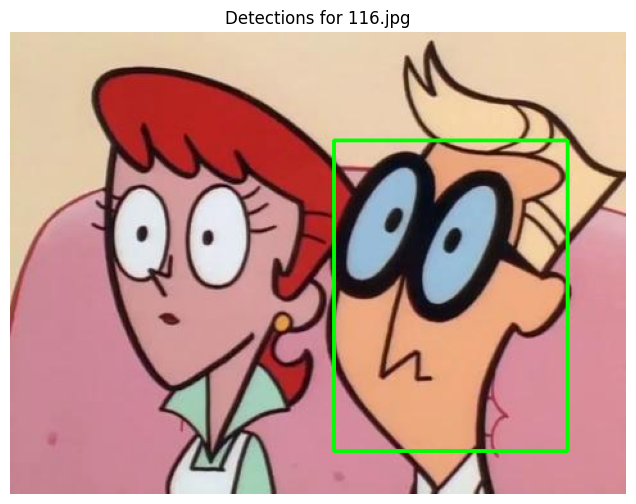

Processing time for image 116/200: 1.23 sec.

Processing test image 117/200: 117.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 117/200: 1.02 sec.

Processing test image 118/200: 118.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 118/200: 1.02 sec.

Processing test image 119/200: 119.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

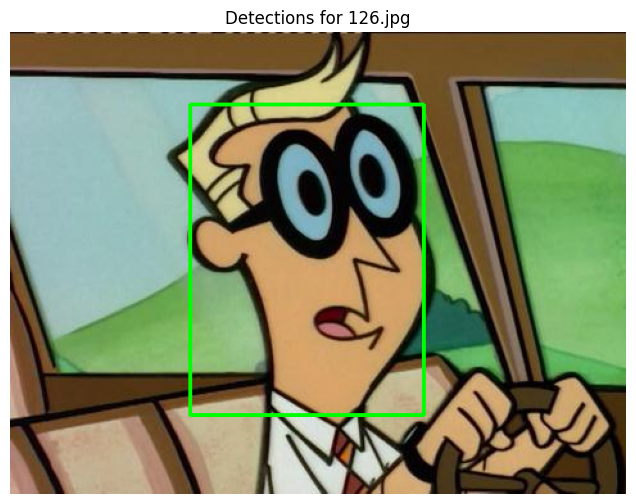

Processing time for image 126/200: 1.16 sec.

Processing test image 127/200: 127.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 127/200: 1.03 sec.

Processing test image 128/200: 128.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 128/200: 1.03 sec.

Processing test image 129/200: 129.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

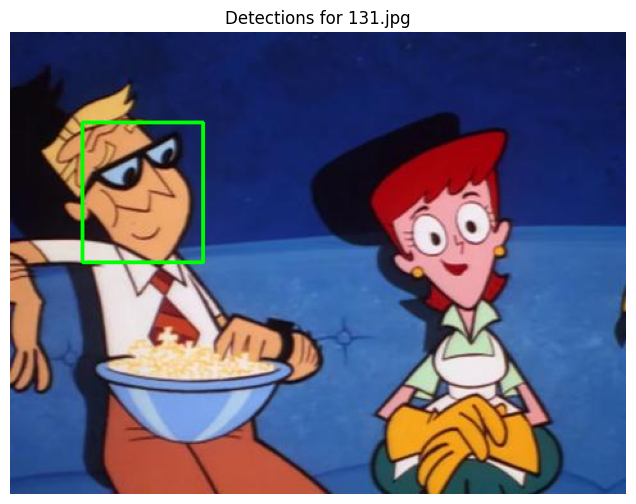

Processing time for image 131/200: 1.18 sec.

Processing test image 132/200: 132.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 132/200: 1.03 sec.

Processing test image 133/200: 133.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 133/200: 1.04 sec.

Processing test image 134/200: 134.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

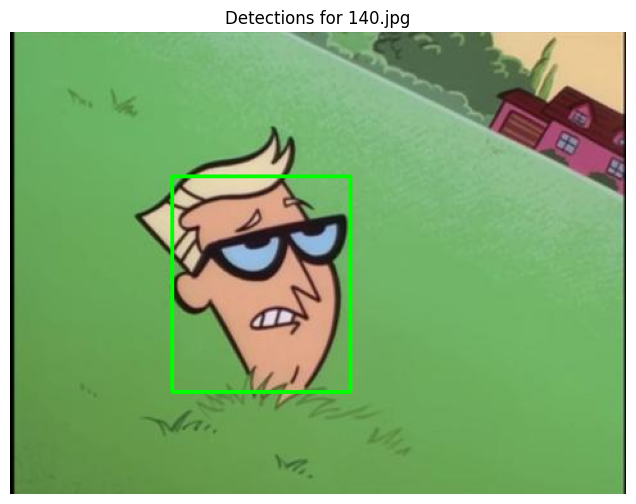

Processing time for image 140/200: 1.17 sec.

Processing test image 141/200: 141.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 141/200: 1.03 sec.

Processing test image 142/200: 142.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 142/200: 1.04 sec.

Processing test image 143/200: 143.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

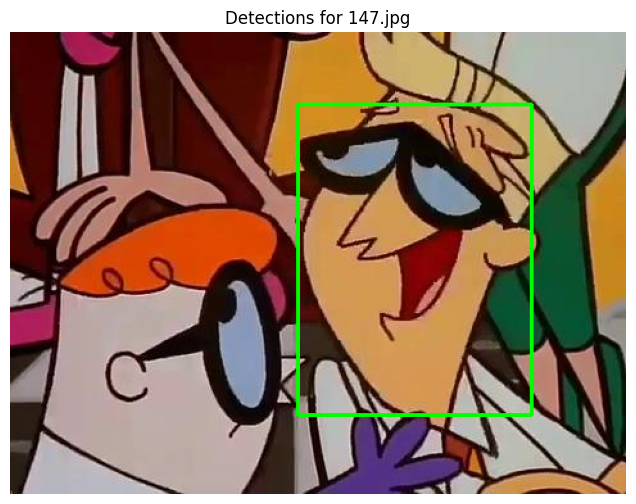

Processing time for image 147/200: 1.21 sec.

Processing test image 148/200: 148.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 148/200: 1.04 sec.

Processing test image 149/200: 149.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 149/200: 1.03 sec.

Processing test image 150/200: 150.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

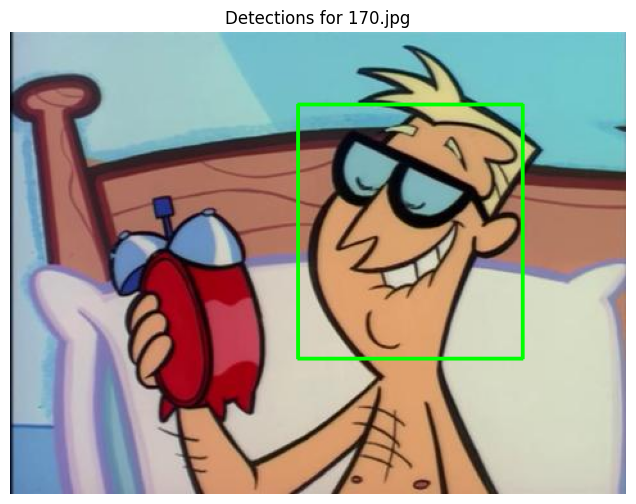

Processing time for image 170/200: 1.18 sec.

Processing test image 171/200: 171.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 171/200: 1.07 sec.

Processing test image 172/200: 172.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
2 patches with score > 0.95 identified.
Applying Non-Maximal Suppression (NMS) ...
1 final detections kept after NMS.


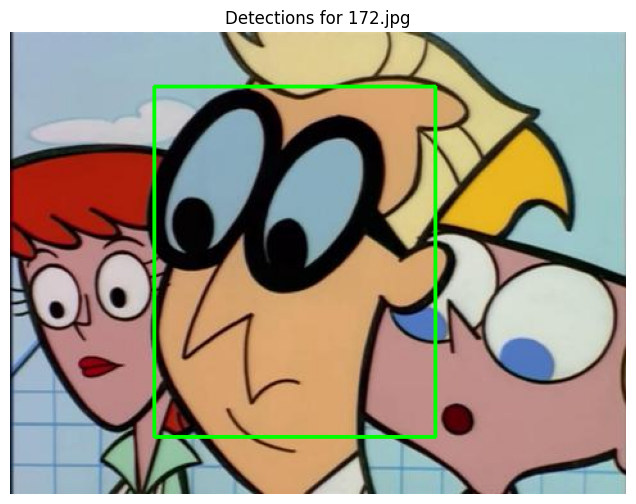

Processing time for image 172/200: 1.16 sec.

Processing test image 173/200: 173.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 173/200: 1.05 sec.

Processing test image 174/200: 174.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 174/200: 1.02 sec.

Processing test image 175/200: 175.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

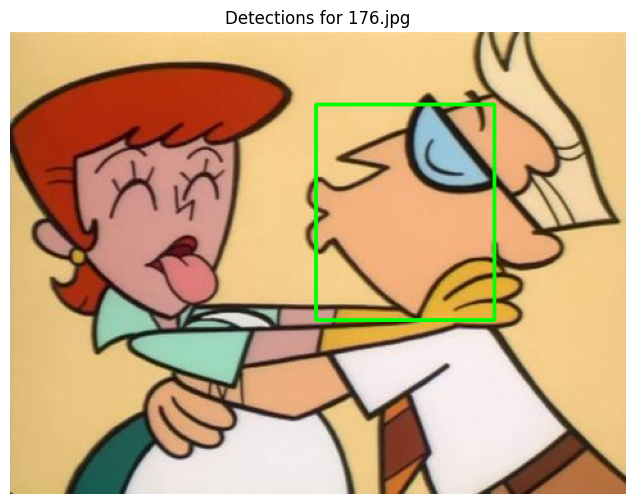

Processing time for image 176/200: 1.20 sec.

Processing test image 177/200: 177.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
1 patches with score > 0.95 identified.
Applying Non-Maximal Suppression (NMS) ...
1 final detections kept after NMS.


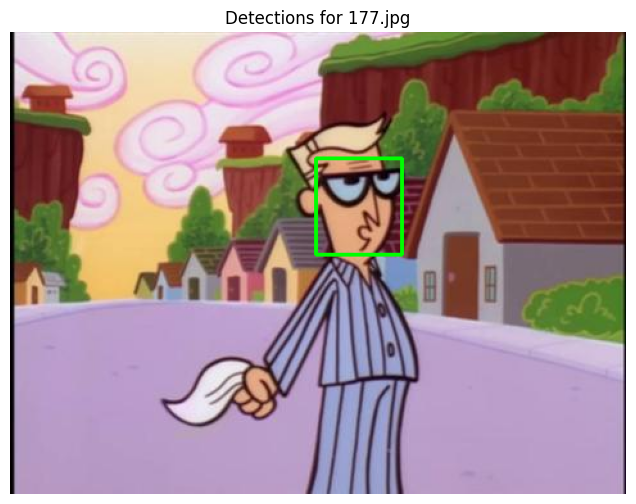

Processing time for image 177/200: 1.22 sec.

Processing test image 178/200: 178.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 178/200: 1.05 sec.

Processing test image 179/200: 179.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 179/200: 1.07 sec.

Processing test image 180/200: 180.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

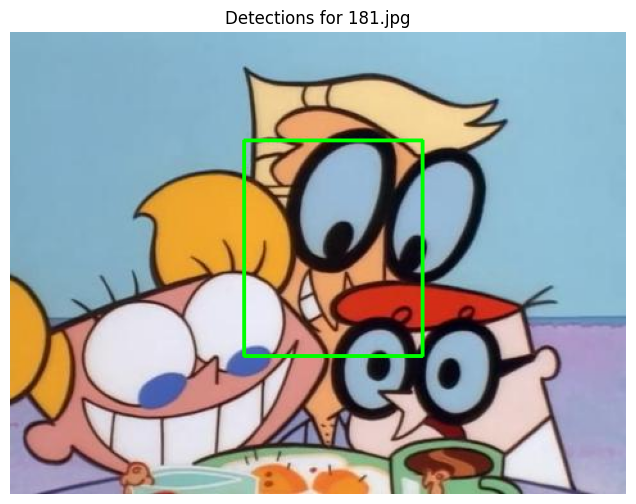

Processing time for image 181/200: 1.18 sec.

Processing test image 182/200: 182.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 182/200: 1.03 sec.

Processing test image 183/200: 183.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 183/200: 1.03 sec.

Processing test image 184/200: 184.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

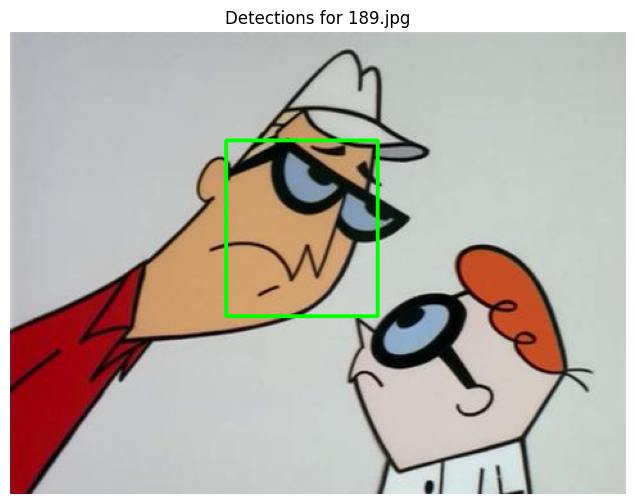

Processing time for image 189/200: 1.13 sec.

Processing test image 190/200: 190.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 190/200: 1.01 sec.

Processing test image 191/200: 191.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 191/200: 1.04 sec.

Processing test image 192/200: 192.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

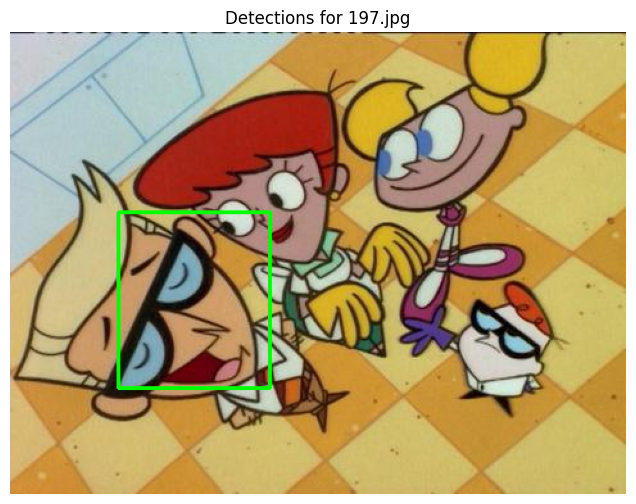

Processing time for image 197/200: 1.16 sec.

Processing test image 198/200: 198.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 198/200: 1.05 sec.

Processing test image 199/200: 199.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Processing time for image 199/200: 1.05 sec.

Processing test image 200/200: 200.jpg
Image size: 480x360
Generating patches using sliding-window ...
2779 patches generated.
Predicting on patches ...
87/87 [==============================] - 0s 4ms/step
0 patches with score > 0.95 identified.
No valid patch detected in this image.
Process

In [15]:
# Validation of the model for the character: DAD

dim_window = 64
dim_hog_cell = 14
threshold = 0.95  # modified threshold for sliding-window
validation_path = "./validare/validare"

def intersection_over_union(bbox_a, bbox_b):
    x_a = max(bbox_a[0], bbox_b[0])
    y_a = max(bbox_a[1], bbox_b[1])
    x_b = min(bbox_a[2], bbox_b[2])
    y_b = min(bbox_a[3], bbox_b[3])
    inter_area = max(0, x_b - x_a + 1) * max(0, y_b - y_a + 1)
    box_a_area = (bbox_a[2] - bbox_a[0] + 1) * (bbox_a[3] - bbox_a[1] + 1)
    box_b_area = (bbox_b[2] - bbox_b[0] + 1) * (bbox_b[3] - bbox_b[1] + 1)
    iou = inter_area / float(box_a_area + box_b_area - inter_area)
    return iou

def non_maximal_suppression(image_detections, image_scores, image_size):
    x_out_of_bounds = np.where(image_detections[:, 2] > image_size[1])[0]
    y_out_of_bounds = np.where(image_detections[:, 3] > image_size[0])[0]
    image_detections[x_out_of_bounds, 2] = image_size[1]
    image_detections[y_out_of_bounds, 3] = image_size[0]
    sorted_indices = np.flipud(np.argsort(image_scores))
    sorted_image_detections = image_detections[sorted_indices]
    sorted_scores = image_scores[sorted_indices]
    is_maximal = np.ones(len(sorted_image_detections)).astype(bool)
    iou_threshold = 0.001
    for i in range(len(sorted_image_detections) - 1):
        if is_maximal[i]:
            for j in range(i + 1, len(sorted_image_detections)):
                if is_maximal[j]:
                    if intersection_over_union(sorted_image_detections[i], sorted_image_detections[j]) > iou_threshold:
                        is_maximal[j] = False
                    else:
                        c_x = (sorted_image_detections[j][0] + sorted_image_detections[j][2]) / 2
                        c_y = (sorted_image_detections[j][1] + sorted_image_detections[j][3]) / 2
                        if sorted_image_detections[i][0] <= c_x <= sorted_image_detections[i][2] and \
                           sorted_image_detections[i][1] <= c_y <= sorted_image_detections[i][3]:
                            is_maximal[j] = False
    return sorted_image_detections[is_maximal], sorted_scores[is_maximal]


dad_image_dimensions = np.array(dad_image_dimensions)
try:
    kmeans = KMeans(n_clusters=10, random_state=0)
    kmeans.fit(dad_image_dimensions)
    kmeans_centers = kmeans.cluster_centers_
except Exception as e:
    print("Could not obtain dimensions from image_dimensions. Using default value [[64, 64]].")
    kmeans_centers = np.array([[64, 64]])

print("Sliding-window dimensions to test (kmeans.cluster_centers_):")
print(kmeans_centers)

test_images_path = os.path.join(validation_path, '*.jpg')
test_files = glob.glob(test_images_path)
test_files.sort()

detections = []
scores = []
file_names = []

num_test_images = len(test_files)
print(f"{num_test_images} test images found.")

for i, test_file in enumerate(test_files):
    start_time = timeit.default_timer()
    print(f"\nProcessing test image {i+1}/{num_test_images}: {os.path.basename(test_file)}")
    img = cv2.imread(test_file)
    img = cv2.resize(img, (480, 360), interpolation=cv2.INTER_LANCZOS4)
    img_height, img_width, channels = img.shape
    num_cols = img_width // dim_hog_cell - 1
    num_rows = img_height // dim_hog_cell - 1

    patches = []
    patch_positions = []

    print(f"Image size: {img_width}x{img_height}")
    print("Generating patches using sliding-window ...")

    for (dim_window_x, dim_window_y) in kmeans_centers:
        dim_window_x = int(round(dim_window_x))
        dim_window_y = int(round(dim_window_y))
        step_x = dim_window_x // dim_hog_cell
        step_y = dim_window_y // dim_hog_cell
        for y in range(0, num_rows - step_y):
            for x in range(0, num_cols - step_x):
                x_min = x * dim_hog_cell
                y_min = y * dim_hog_cell
                x_max = x_min + dim_window_x
                y_max = y_min + dim_window_y
                if x_max > img_width or y_max > img_height:
                    continue
                patch = cv2.resize(img[y_min:y_max, x_min:x_max], (dim_window, dim_window), interpolation=cv2.INTER_LANCZOS4)
                patches.append(patch)
                patch_positions.append([x_min, y_min, x_max, y_max])
                
    print(f"{len(patches)} patches generated.")
    if patches:
        patches = np.array(patches).astype('float32') / 255.0
        patches = patches.reshape(-1, dim_window, dim_window, 3)
        
        print("Predicting on patches ...")
        predictions = model.predict(patches)
        valid_indices = predictions[:, 0] > threshold
        print(f"{np.sum(valid_indices)} patches with score > {threshold} identified.")
        
        image_detections = np.array(patch_positions)[valid_indices]
        image_scores = predictions[valid_indices, 0]
        
        if len(image_scores) > 0:
            print("Applying Non-Maximal Suppression (NMS) ...")
            image_detections, image_scores = non_maximal_suppression(image_detections, image_scores, img.shape)
            print(f"{len(image_scores)} final detections kept after NMS.")
            
            detections.extend(image_detections)
            scores.extend(image_scores)
            file_names.extend([os.path.basename(test_file)] * len(image_scores))
            
            img_with_boxes = img.copy()
            for box in image_detections:
                x1, y1, x2, y2 = box
                cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)
            plt.figure(figsize=(8, 6))
            plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
            plt.title(f"Detections for {os.path.basename(test_file)}")
            plt.axis('off')
            plt.show()
        else:
            print("No valid patch detected in this image.")
            
    end_time = timeit.default_timer()
    print(f"Processing time for image {i+1}/{num_test_images}: {end_time - start_time:.2f} sec.")

detections = np.array(detections)
scores = np.array(scores)
file_names = np.array(file_names)